<a href="https://colab.research.google.com/github/Pranavvr/Airline_Customer_Satisfaction/blob/main/CuSat4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install dalex

     |████████████████████████████████| 1.0 MB 5.2 MB/s 
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
  Created wheel for dalex: filename=dalex-1.4.1-py3-none-any.whl size=1042860 sha256=ee8308486de65f23ab3339c534c68e65271f2e5188aaa9324be0da4da5e28765
  Stored in directory: /root/.cache/pip/wheels/8c/8e/1b/95d59374d386e8e495aed6cbab4c4b6d72be73993a424c5e12
Successfully built dalex
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import dalex as dx
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression, LogisticRegressionCV, Lasso, lars_path
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, plot_confusion_matrix,classification_report, f1_score, precision_score, recall_score
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/ML Research/trainfff.csv')
df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [ ]:
df.describe()

,Unnamed: 0,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,64939.500000,64940.500000,39.427957,1190.316392,2.728696,3.057599,2.756876,2.976925,3.204774,3.252633,3.441361,3.358077,3.383023,3.350878,3.632114,3.306267,3.642193,3.286326,14.713713,15.091129
std,37493.270818,37493.270818,15.119360,997.452477,1.329340,1.526741,1.401740,1.278520,1.329933,1.350719,1.319289,1.334049,1.287099,1.316252,1.180025,1.266185,1.176669,1.313682,38.071126,38.465650
min,0.000000,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32469.750000,32470.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,64939.500000,64940.500000,40.000000,844.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,97409.250000,97410.250000,51.000000,1744.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,129879.000000,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [ ]:
df.isnull().sum()

Unnamed: 0                             0
id                                     0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             393
satisfaction    

In [ ]:
df=df.drop(df.iloc[:,[0, 1]], axis=1)
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [ ]:
df['Arrival Delay in Minutes'].fillna(df['Arrival Delay in Minutes'].median(axis=0), inplace=True)
#df.head()

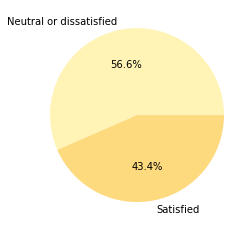

In [ ]:
plt.pie(df.satisfaction.value_counts(),
        labels = ["Neutral or dissatisfied", "Satisfied"],
        colors = sns.color_palette("YlOrBr"), autopct = '%1.1f%%')
pass

In [ ]:
#Mapping the values
df['satisfaction'] = df['satisfaction'].map({'neutral or dissatisfied':0 , 'satisfied':1})
df['Customer Type'] = df['Customer Type'].map({'Loyal Customer':1, 'disloyal Customer':0})
df['Type of Travel'] = df['Type of Travel'].map({'Personal Travel':0, 'Business travel':1})

In [ ]:
df=pd.get_dummies(df)
df.head()

,Customer Type,Age,Type of Travel,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,...,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Gender_Female,Gender_Male,Class_Business,Class_Eco,Class_Eco Plus
0,1,13,0,460,3,4,3,1,5,3,...,5,5,25,18.0,0,0,1,0,0,1
1,0,25,1,235,3,2,3,3,1,3,...,4,1,1,6.0,0,0,1,1,0,0
2,1,26,1,1142,2,2,2,2,5,5,...,4,5,0,0.0,1,1,0,1,0,0
3,1,25,1,562,2,5,5,5,2,2,...,4,2,11,9.0,0,1,0,1,0,0
4,1,61,1,214,3,3,3,3,4,5,...,3,3,0,0.0,1,0,1,1,0,0


In [ ]:
#Preparing X and Y
X = df.drop('satisfaction', axis=1)
y = df['satisfaction']

In [ ]:
#Train-Test Split
#X_train, X_test, y_train, y_test = train_test_split(x.values, y, test_size=0.3, random_state=42)

In [ ]:
# Normalize Features
scaler = StandardScaler()
X_tr = scaler.fit_transform(X.values)
#X_test = scaler.transform(X_test)

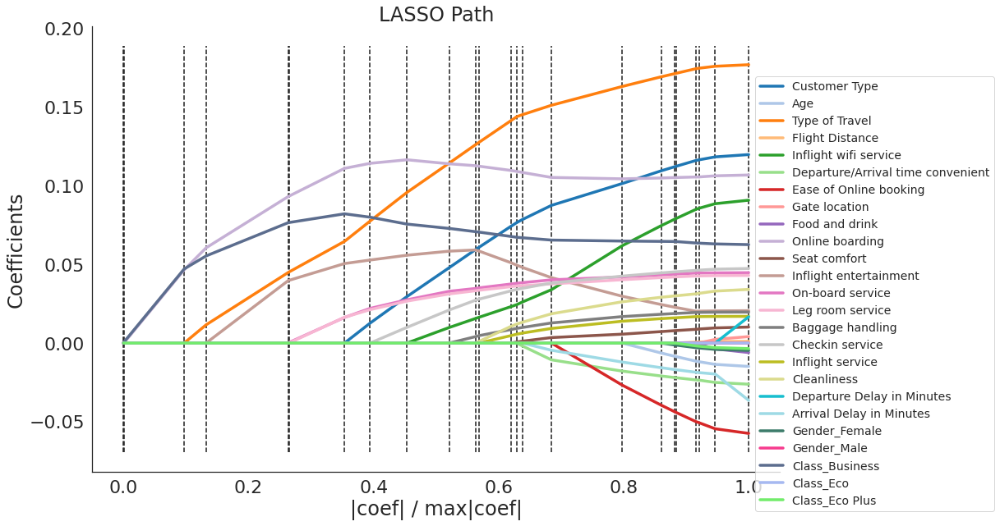

In [ ]:
alphas, _, coefs = lars_path(X_tr, y.values, method='lasso')

from cycler import cycler

# plotting the LARS path
sns.set(style='white',font_scale=2)
xx = np.sum(np.abs(coefs.T), axis=1)
xx /= xx[-1]

plt.rc('axes', prop_cycle =(cycler(color =['#1F77B4', '#AEC7E8', '#FF7F0E', '#FFBB78', '#2CA02C', '#98DF8A',
                                            '#D62728', '#FF9896', '#9467BD', '#C5B0D5', '#8C564B', '#C49C94',
                                            '#E377C2', '#F7B6D2', '#7F7F7F', '#C7C7C7', '#BCBD22', '#DBDB8D',
                                            '#17BECF', '#9EDAE5', '#3D7C6A', '#F63B8D', '#5C6D8E', '#A6B9F1', '#72EC6B', '#BBA8C4'])))

plt.figure(figsize=(15,10))
plt.plot(xx, coefs.T,linewidth=3.5)

ymin, ymax = plt.ylim()
plt.vlines(xx, ymin, ymax, linestyle='dashed')
plt.xlabel('|coef| / max|coef|')
plt.ylabel('Coefficients')
plt.title('LASSO Path')
plt.axis('tight')
plt.legend(X.columns,loc="upper right", bbox_to_anchor=(1.32, 0.9),fontsize=14)
sns.despine()
plt.savefig('lassoplot.png',transparent=True, bbox_inches='tight')

In [ ]:
#Dropping age, gender and gate location
df.drop(['Age', 'Gender_Male', 'Gender_Female', 'Food and drink', 'Gate location'], axis=1, inplace=True)
df.head()

,Customer Type,Type of Travel,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Online boarding,Seat comfort,Inflight entertainment,On-board service,...,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Class_Business,Class_Eco,Class_Eco Plus
0,1,0,460,3,4,3,3,5,5,4,...,4,4,5,5,25,18.0,0,0,0,1
1,0,1,235,3,2,3,3,1,1,1,...,3,1,4,1,1,6.0,0,1,0,0
2,1,1,1142,2,2,2,5,5,5,4,...,4,4,4,5,0,0.0,1,1,0,0
3,1,1,562,2,5,5,2,2,2,2,...,3,1,4,2,11,9.0,0,1,0,0
4,1,1,214,3,3,3,5,5,3,3,...,4,3,3,3,0,0.0,1,1,0,0


In [ ]:
y = df['satisfaction']
X = df.drop('satisfaction',axis=1)

In [ ]:
x=pd.DataFrame(X)
Y=pd.DataFrame(y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
cat_features = [feature for feature in df.columns if df[feature].dtypes == 'O']
print('Number of categorical variables: ', len(cat_features))
#print('*'*80)
print('Categorical variables column name:',cat_features)

Number of categorical variables:  0
Categorical variables column name: []


In [ ]:
imp_features = [feature for feature in df.columns if df[feature].dtypes != 'O']
print('Number of numerical variables: ', len(imp_features))
#print('*'*80)
print('Numerical Variables Column: ',imp_features)

Number of numerical variables:  26
Numerical Variables Column:  ['Customer Type', 'Age', 'Type of Travel', 'Flight Distance', 'Inflight wifi service', 'Departure/Arrival time convenient', 'Ease of Online booking', 'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort', 'Inflight entertainment', 'On-board service', 'Leg room service', 'Baggage handling', 'Checkin service', 'Inflight service', 'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes', 'satisfaction', 'Gender_Female', 'Gender_Male', 'Class_Business', 'Class_Eco', 'Class_Eco Plus']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matp

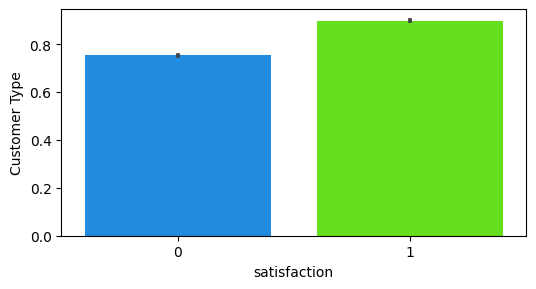

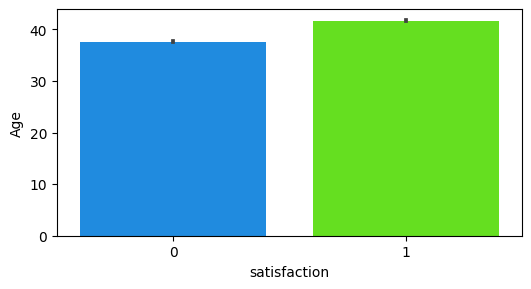

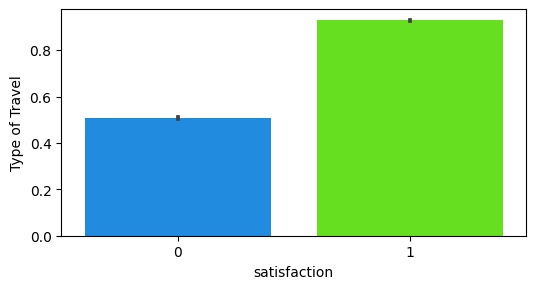

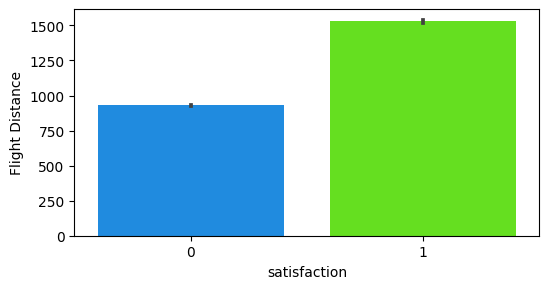

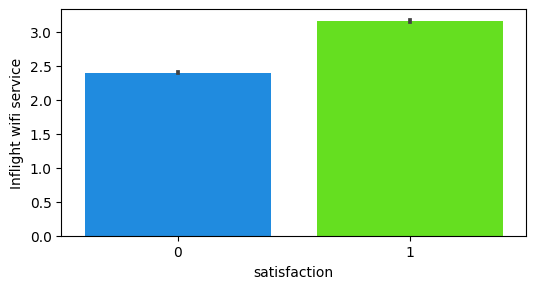

...

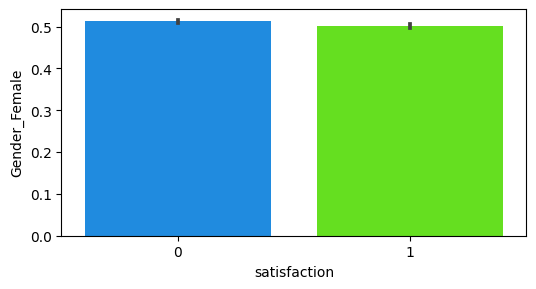

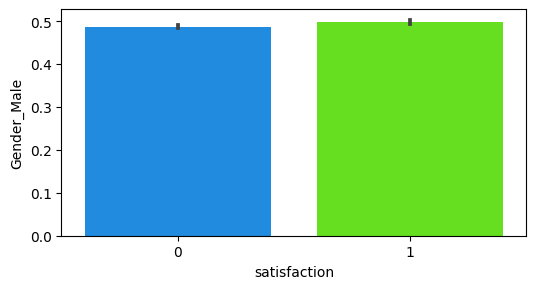

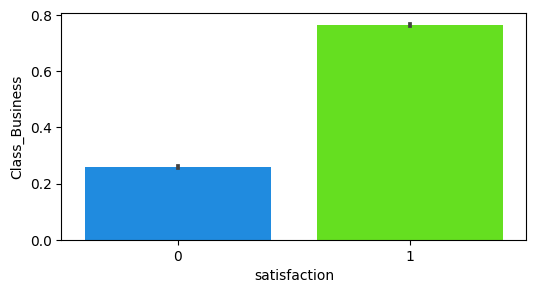

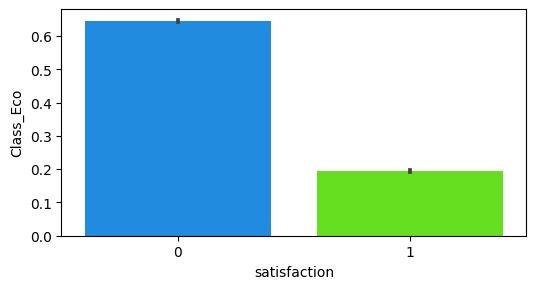

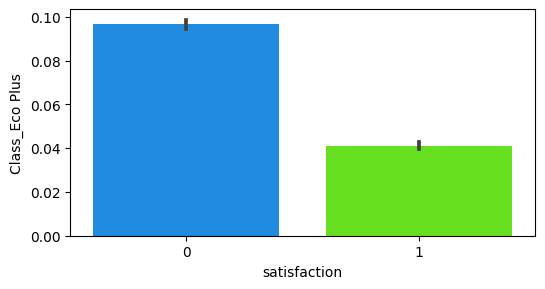

In [ ]:
#Plotting the barplot of numerical features
for col in imp_features:
    plt.figure(figsize=(6,3), dpi=100)
    sns.barplot(data=df,x='satisfaction',y=col,palette='gist_rainbow_r')

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# Naive Bayes
from sklearn.naive_bayes import GaussianNB

In [ ]:
nbc = GaussianNB()
nbc.fit (X_train, y_train)
#nbc_training_score = 100*nbc.score(X_train,y_train)
#nbc_test_score = 100*nbc.score(X_test,y_test)
#print("Naive Bayes accuracy. Train : {:.2f}%, Test: {:.2f}%. ".format(nbc_training_score, nbc_test_score))

GaussianNB()

In [ ]:
pred_nbc = nbc.predict(X_test)
accuracy_score(y_test,pred_nbc)

0.849810081100503

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
# Logistic Regression
logr = LogisticRegression(max_iter=2500, C=100)
logr.fit (X_train, y_train)
#logr_training_score = 100*logr.score(X_train,y_train)
#logr_test_score = 100*logr.score(X_test,y_test)
#print("Logistic Regression accuracy. Train : {:.2f}%, Test: {:.2f}%. ".format(logr_training_score, logr_test_score))

LogisticRegression(C=100, max_iter=2500)

In [ ]:
pred_logr = logr.predict(X_test)
print(accuracy_score(y_test,pred_logr))
print(precision_score(y_test,pred_logr))
print(recall_score(y_test,pred_logr))
print(f1_score(y_test,pred_logr))

0.8740889025767375
0.8688694802418616
0.837562555195761
0.8529288326638287


In [ ]:
print(classification_report(y_test, pred_logr))

              precision    recall  f1-score   support

           0       0.88      0.90      0.89     21979
           1       0.87      0.84      0.85     16985

    accuracy                           0.87     38964
   macro avg       0.87      0.87      0.87     38964
weighted avg       0.87      0.87      0.87     38964



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


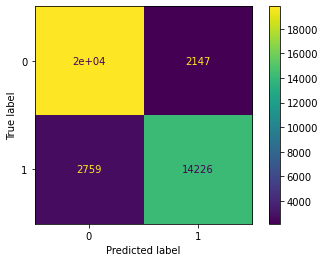

In [ ]:
plot_confusion_matrix(logr, X_test, y_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rfc = RandomForestClassifier(n_estimators=200, max_depth=8, random_state=0)
rfc.fit(X_train,y_train)
#random_forest_training_score = 100*rfc.score(X_train,y_train)
#random_forest_test_score = 100*rfc.score(X_test,y_test)
#print("Random forest accuracy, 200 estimators. Train : {:.2f}%, Test: {:.2f}%. ".format(random_forest_training_score, random_forest_test_score))

RandomForestClassifier(max_depth=8, n_estimators=200, random_state=0)

In [ ]:
pred_rfc = rfc.predict(X_test)
print(accuracy_score(y_test,pred_rfc))
print(precision_score(y_test,pred_rfc))
print(recall_score(y_test,pred_rfc))
print(f1_score(y_test,pred_rfc))

0.9362488450877733
0.9332018880325028
0.9195760965557845
0.9263388885593974


In [ ]:
print(classification_report(y_test, pred_rfc))

              precision    recall  f1-score   support

           0       0.94      0.95      0.94     21979
           1       0.93      0.92      0.93     16985

    accuracy                           0.94     38964
   macro avg       0.94      0.93      0.94     38964
weighted avg       0.94      0.94      0.94     38964



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


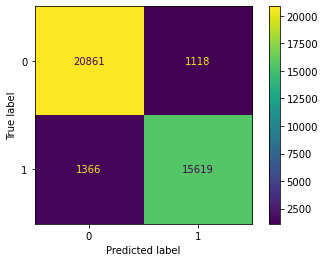

In [ ]:
plot_confusion_matrix(rfc, X_test, y_test)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=6, random_state=0)
dtc.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=6, random_state=0)

In [ ]:
pred_dtc = dtc.predict(X_test)
print(accuracy_score(y_test,pred_dtc))
print(precision_score(y_test,pred_dtc))
print(recall_score(y_test,pred_dtc))
print(f1_score(y_test,pred_dtc))

0.9176932553125963
0.8933873915029694
0.9211068589932293
0.9070353943821202


In [ ]:
print(classification_report(y_test, pred_dtc))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93     21979
           1       0.89      0.92      0.91     16985

    accuracy                           0.92     38964
   macro avg       0.92      0.92      0.92     38964
weighted avg       0.92      0.92      0.92     38964



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


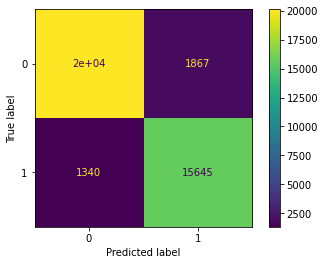

In [ ]:
plot_confusion_matrix(dtc, X_test, y_test)

In [ ]:
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier

In [ ]:
estimators = [\
    #('nbc', GaussianNB()), \
    ('logr', LogisticRegression(max_iter=2500)), \
    ('rfc', RandomForestClassifier(n_estimators=200)), \
    ('dtc', DecisionTreeClassifier(splitter='best')) \
    #('svc', SVC()) \
#   , ('svc', SVC(kernel='linear'))
             ]
clf = StackingClassifier(estimators=estimators, final_estimator=XGBClassifier())
clf.fit(X_train, y_train)
#clf_training_score = 100*clf.score(X_train,y_train)
#clf_test_score = 100*clf.score(X_test,y_test)
#print("Stacked classifier accuracy. Train : {:.2f}%, Test: {:.2f}%. ".format(clf_training_score, clf_test_score))

StackingClassifier(estimators=[('logr', LogisticRegression(max_iter=2500)),
                               ('rfc',
                                RandomForestClassifier(n_estimators=200)),
                               ('dtc', DecisionTreeClassifier())],
                   final_estimator=XGBClassifier())

In [ ]:
pred_stc = clf.predict(X_test)
print(accuracy_score(y_test,pred_stc))
print(precision_score(y_test,pred_stc))
print(recall_score(y_test,pred_stc))
print(f1_score(y_test,pred_stc))

0.9625551791397187
0.9783707172787774
0.934765969973506
0.9560714178183242


In [ ]:
print(classification_report(y_test, pred_stc))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97     21979
           1       0.98      0.93      0.96     16985

    accuracy                           0.96     38964
   macro avg       0.96      0.96      0.96     38964
weighted avg       0.96      0.96      0.96     38964



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


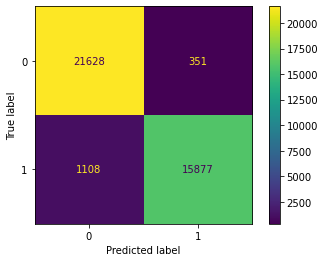

In [ ]:
plot_confusion_matrix(clf, X_test, y_test)

In [ ]:
exp=dx.Explainer(clf, X, y)

Preparation of a new explainer is initiated

  -> data              : 129880 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 129880 values
  -> model_class       : sklearn.ensemble._stacking.StackingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f5adde97dd0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


  -> predicted values  : min = 0.000133, mean = 0.437, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.995, mean = -0.00205, max = 1.0
  -> model_info        : package sklearn

A new explainer has been created!


In [ ]:
exp_lr=dx.Explainer(logr, X, y)
exp_rfc=dx.Explainer(rfc, X, y)
exp_dtc=dx.Explainer(dtc,X, y)

Preparation of a new explainer is initiated

  -> data              : 129880 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 129880 values
  -> model_class       : sklearn.linear_model._logistic.LogisticRegression (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f5adde97dd0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 2.85e-05, mean = 0.434, max = 0.996
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.985, mean = 0.000212, max = 1.0
  -> model_info        : package sklearn

A new explainer has been created!
Preparation of a new explainer is initiated

  -> data              : 129880 rows 25 cols
  -> target var

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"


  -> predicted values  : min = 0.00569, mean = 0.434, max = 0.991
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.958, mean = 0.000323, max = 0.974
  -> model_info        : package sklearn

A new explainer has been created!
Preparation of a new explainer is initiated

  -> data              : 129880 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 129880 values
  -> model_class       : sklearn.tree._classes.DecisionTreeClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f5adde97dd0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.434, max = 1.0
  -> model type        : classification will be u

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


In [ ]:
# prepare list of Explainer objects
exp_list = [exp, exp_lr, exp_rfc, exp_dtc]

In [ ]:
pd.concat([exp.model_performance().result for exp in exp_list])

,recall,precision,f1,accuracy,auc
StackingClassifier,0.980364,0.993695,0.986985,0.988767,0.999162
LogisticRegression,0.835631,0.869773,0.852360,0.874230,0.926390
RandomForestClassifier,0.921440,0.935616,0.928474,0.938320,0.987115
DecisionTreeClassifier,0.922928,0.895967,0.909248,0.919957,0.976141


In [ ]:
exp_list[0].model_performance().plot([exp.model_performance() for exp in exp_list[1:]])

In [ ]:
exp_list[0].model_parts().plot([exp.model_parts() for exp in exp_list[1:]], max_vars=15)

In [ ]:
exp.model_parts().plot(max_vars=20)

In [ ]:
exp_lr.model_parts().plot(max_vars=20)

In [ ]:
exp_rfc.model_parts().plot(max_vars=20)

In [ ]:
exp_dtc.model_parts().plot(max_vars=20)

In [ ]:
exp_list[0].model_profile().plot(
    [exp.model_profile() for exp in exp_list[1:]],
    variables=['Inflight wifi service', 'Inflight service', 'Leg room service', 'Seat comfort'],
    title="Partial Dependence"
)

Calculating ceteris paribus: 100%|██████████| 25/25 [00:00<00:00, 61.61it/s]


In [ ]:
exp_list[0].model_profile().plot(
    [exp.model_profile() for exp in exp_list[1:]],
    variables=['Class_Business', 'Class_Eco', 'Class_Eco Plus'],
    title="Partial Dependence"
)

Calculating ceteris paribus: 100%|██████████| 25/25 [00:00<00:00, 63.99it/s]


In [ ]:
exp_list[0].model_profile().plot(
    [exp.model_profile() for exp in exp_list[1:]],
    variables=['Ease of Online booking', 'Online boarding', 'On-board service', 'Baggage handling'],
    title="Partial Dependence"
)

Calculating ceteris paribus: 100%|██████████| 25/25 [00:00<00:00, 61.60it/s]


In [ ]:
exp_list[0].model_profile().plot(
    [exp.model_profile() for exp in exp_list[1:]],
    variables=['Type of Travel', 'Customer Type', 'Cleanliness', 'Inflight entertainment'],
    title="Partial Dependence"
)

Calculating ceteris paribus: 100%|██████████| 25/25 [00:00<00:00, 61.74it/s]
